# Import libraries

In [29]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import pycaret as py
from pycaret.classification import *

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

import os

if PyCaret is not installed install as follows 

__Colab__

- !pip install pycaret[analysis,models]
- -!pip install "schemdraw<0.16" #<-- To handle dependency issues

__Conda__

- conda activate your_environment_name
- pip install pycaret

In [3]:
print(py.__version__)

3.2.0


# Helper functions

In [71]:
def plot_on_lift_or_not_on_lift(df, plot_title='On lift vs. not on lift'):
    """
    Plot altitude over time, colored by 'on_lift' status.
    Will not plot if 'Timestamp' column is in wrong format.

    Parameters:
        df (DataFrame): DataFrame containing 'Timestamp' and 'Alt(m)' columns.
        plot_title (str, optional): Title of the plot (default is 'On lift vs. not on lift').

    This function creates a scatter plot to visualize the altitude changes over time.
    Altitude data is color-coded based on the 'on_lift' status: 'On the lift' (in red) and 'Not on the lift' (in blue).
    Customize line thickness and marker size as needed.
    """

    # Check if 'Timestamp' column exists and is in datetime format
    if 'Timestamp' in df.columns and pd.api.types.is_datetime64_any_dtype(df['Timestamp']):
        # Plot for Altitude over Time, colored by 'on_lift' status
        plt.figure(figsize=(15, 5))

        # Plot points where 'on_lift' is 1 with one color
        plt.scatter(df.loc[df['on_lift'] == 1, 'Timestamp'],
                    df.loc[df['on_lift'] == 1, 'Alt(m)'],
                    c='red',
                    label='On the lift',
                    marker='o',
                    linewidths=3,
                    s=2
                   )

        # Plot points where 'on_lift' is 0 with another color
        plt.scatter(df.loc[df['on_lift'] == 0, 'Timestamp'],
                    df.loc[df['on_lift'] == 0, 'Alt(m)'],
                    c='blue',
                    label='Not on the lift',
                    marker='o',
                    linewidths=3,
                    s=2)

        plt.title(plot_title)
        plt.xlabel('Timestamp')
        plt.ylabel('Altitude (m)')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print("Warning: DataFrame's 'Timestamp' column is not in datetime format and must be converted first.")


In [72]:
def check_predictions(df, predicted_column, plot_title='Predictions'):
    # Check if 'Timestamp' column exists and is in datetime format
    if 'Timestamp' in df.columns and pd.api.types.is_datetime64_any_dtype(df['Timestamp']):
        # Create a scatter plot for Altitude over Time, colored by 'predicted' class
        fig = px.scatter(df, x='Timestamp', y='Alt(m)', color=predicted_column,
                         labels={'Alt(m)': 'Altitude (m)'},
                         title=plot_title,
                         color_discrete_map={0: 'blue', 1: 'red'})

        fig.update_traces(marker=dict(size=8),
                          selector=dict(mode='markers'))

        # Customize the legend
        fig.update_layout(
            legend_title_text='Status',
            width=2000,
            height=900
        )

        fig.for_each_trace(lambda trace: trace.update(name='Not on the lift' if trace.name == 0 else 'On the lift'))

        # Show the plot
        fig.show()
    else:
        print("Warning: DataFrame's 'Timestamp' column is not in datetime format and must be converted first.")

# Import data for train and test datasets

In [5]:
# file locations in directory - please update regarding your environment !!!
df_57_file='/Users/ze/Documents/Coding/Projects/alturos/data/processed/df_57_labeled_on_lift.csv'
df_95_file='/Users/ze/Documents/Coding/Projects/alturos/data/processed/df_95_labeled_on_lift.csv'
df_135_file='/Users/ze/Documents/Coding/Projects/alturos/data/processed/df_135_labeled_on_lift.csv'
df_166_file='/Users/ze/Documents/Coding/Projects/alturos/data/processed/df_166m_labeled_on_lift.csv'
df_206_file='/Users/ze/Documents/Coding/Projects/alturos/data/processed/df_206_labeled_on_lift.csv'
df_290_file='/Users/ze/Documents/Coding/Projects/alturos/data/processed/df_290_labeled_on_lift.csv'
df_310_file='/Users/ze/Documents/Coding/Projects/alturos/data/processed/df_310_labeled_on_lift_v4.csv'

In [6]:
# create dataframes from csv files
df_57=pd.read_csv(df_57_file)
df_95=pd.read_csv(df_95_file)
df_135=pd.read_csv(df_135_file)
df_166=pd.read_csv(df_166_file)
df_206=pd.read_csv(df_206_file)
df_290=pd.read_csv(df_290_file)
df_310=pd.read_csv(df_310_file)

In [7]:
# Note that some dataframes still contain columnn with clusters from clustering with DBSCAN, let's remove these

#remove cluster column 
df_95.drop('Cluster_1', axis=1, inplace=True)
df_310.drop('Cluster_1', axis=1, inplace=True)

In [11]:
# list with all dataframes for training
df_lst_train=[
        df_57,
        df_135,
        df_166,
        df_206,
        df_290,
        ]

# list with all dataframes for test
df_lst_test=[
    df_95,
    df_310
]

In [12]:
# Convert to datetime format 
df_57['Timestamp'] = pd.to_datetime(df_57['Timestamp'], unit='ns')
df_95['Timestamp'] = pd.to_datetime(df_95['Timestamp'], unit='ns')
df_135['Timestamp'] = pd.to_datetime(df_135['Timestamp'], unit='ns')
df_166['Timestamp'] = pd.to_datetime(df_166['Timestamp'], unit='ns')
df_206['Timestamp'] = pd.to_datetime(df_206['Timestamp'], unit='ns')
df_290['Timestamp'] = pd.to_datetime(df_290['Timestamp'], unit='ns')
df_310['Timestamp'] = pd.to_datetime(df_310['Timestamp'], unit='ns')

In [16]:
# # if needed Plot and double check imported csv files for correct labelling
# for df in df_lst_train:
#     plot_on_lift_or_not_on_lift(df)
# for df in df_lst_test:
#     plot_on_lift_or_not_on_lift(df)

# Concatenate dfs and feature engineering with outlier removal

In [18]:
# 'ignore_index=True' resets the index of the concatenated dataframe
df_train_concatenated = pd.concat(df_lst_train, ignore_index=True)
# # check result 
# df_train_concatenated

In [20]:
# 'ignore_index=True' resets the index of the concatenated dataframe
df_test_concatenated = pd.concat(df_lst_test, ignore_index=True)
# # check result 
# df_test_concatenated

### Altitude change 

(49093, 46)
(48920, 46)


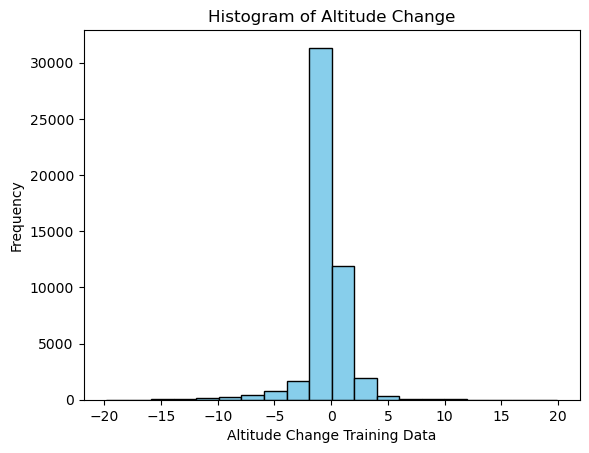

In [21]:
# Add Altitude Change for training data 
df_train_concatenated['Alt(m)_change'] = df_train_concatenated['Alt(m)'].diff().fillna(0)
print(df_train_concatenated.shape)

# Set the threshold value for filtering
threshold = 20

# Filter the DataFrame based on the absolute value of 'Alt(m)_change' column
df_train_concatenated = df_train_concatenated[df_train_concatenated['Alt(m)_change'].abs() <= threshold]

# Verify 
print(df_train_concatenated.shape)
altitude_change_training_data_filtered = df_train_concatenated['Alt(m)_change']

# Create a histogram plot
plt.hist(altitude_change_training_data_filtered, 
         bins=20, 
         color='skyblue', 
         edgecolor='black')

#Add labels and title
plt.xlabel('Altitude Change Training Data')
plt.ylabel('Frequency')
plt.title('Histogram of Altitude Change')

#Show the plot
plt.show()

(24294, 46)
(24243, 46)


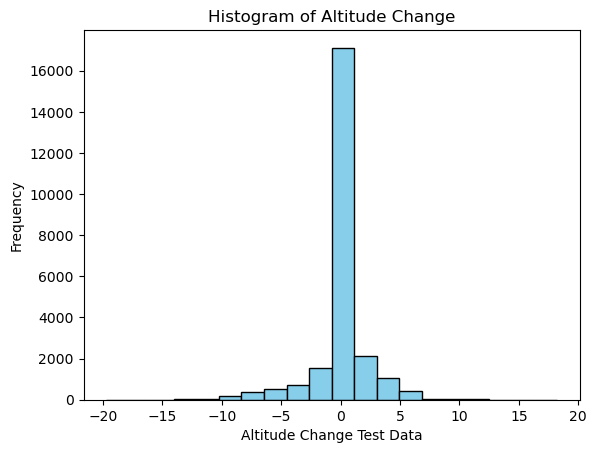

In [22]:
# Add Altitude Change for test data 
df_test_concatenated['Alt(m)_change'] = df_test_concatenated['Alt(m)'].diff().fillna(0)
print(df_test_concatenated.shape)

# Set the threshold value for filtering
threshold = 20

# Filter the DataFrame based on the absolute value of 'Alt(m)_change' column
df_test_concatenated = df_test_concatenated[df_test_concatenated['Alt(m)_change'].abs() <= threshold]


# Verify 
print(df_test_concatenated.shape)
altitude_change_testing_data_filtered = df_test_concatenated['Alt(m)_change']

# Create a histogram plot
plt.hist(altitude_change_testing_data_filtered, 
         bins=20, 
         color='skyblue', 
         edgecolor='black')

#Add labels and title
plt.xlabel('Altitude Change Test Data')
plt.ylabel('Frequency')
plt.title('Histogram of Altitude Change')

#Show the plot
plt.show()

### Speed change 

(48920, 47)
(48509, 47)


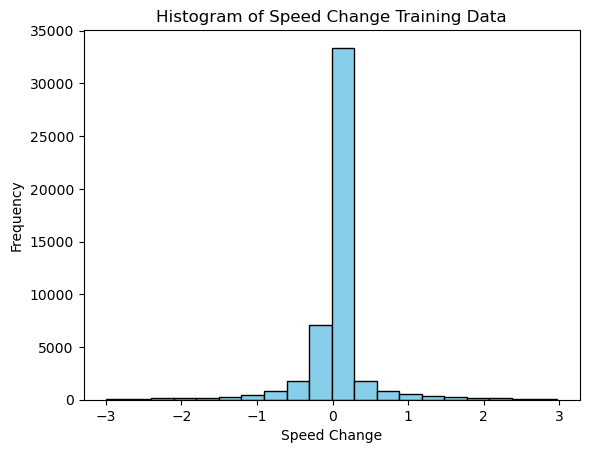

In [23]:
# Add Speed Change for training data 
df_train_concatenated['Speed(m/s)_change'] = df_train_concatenated['Speed(m/s)'].diff().fillna(0)
print(df_train_concatenated.shape)

# Set the threshold value for filtering
threshold = 3

# Filter the DataFrame based on the absolute value of 'Speed(m/s)_change' column
df_train_concatenated = df_train_concatenated[df_train_concatenated['Speed(m/s)_change'].abs() <= threshold]

# Verify 
print(df_train_concatenated.shape)
speed_change_training_data_filtered = df_train_concatenated['Speed(m/s)_change']

# Create a histogram plot
plt.hist(speed_change_training_data_filtered, 
         bins=20, 
         color='skyblue', 
         edgecolor='black')

#Add labels and title
plt.xlabel('Speed Change')
plt.ylabel('Frequency')
plt.title('Histogram of Speed Change Training Data')

#Show the plot
plt.show()

(24243, 47)
(24078, 47)


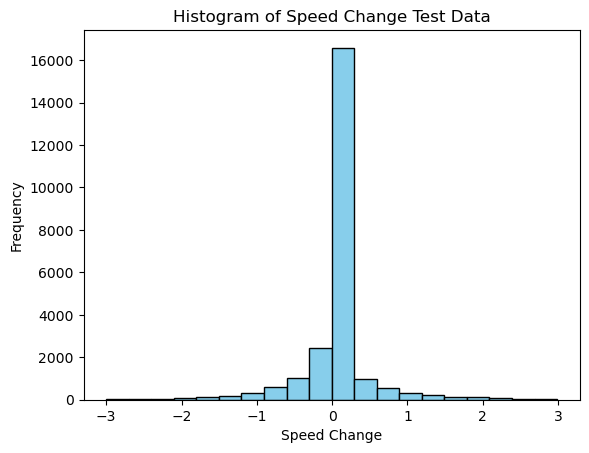

In [24]:
# Add Speed Change for testing data 
df_test_concatenated['Speed(m/s)_change'] = df_test_concatenated['Speed(m/s)'].diff().fillna(0)
print(df_test_concatenated.shape)

# Set the threshold value for filtering
threshold = 3

# Filter the DataFrame based on the absolute value of 'Speed(m/s)_change' column
df_test_concatenated = df_test_concatenated[df_test_concatenated['Speed(m/s)_change'].abs() <= threshold]

# Verify 
print(df_test_concatenated.shape)
speed_change_testing_data_filtered = df_test_concatenated['Speed(m/s)_change']

# Create a histogram plot
plt.hist(speed_change_testing_data_filtered, 
         bins=20, 
         color='skyblue', 
         edgecolor='black')

#Add labels and title
plt.xlabel('Speed Change')
plt.ylabel('Frequency')
plt.title('Histogram of Speed Change Test Data')

#Show the plot
plt.show()

### Course change 

In [25]:
# Add Course Change to training data 
df_train_concatenated['Course_change'] = df_train_concatenated['Course'].diff().fillna(0)
# Add Course Change to test data 
df_test_concatenated['Course_change'] = df_test_concatenated['Course'].diff().fillna(0)

In [27]:
# # Verify 
# print(df_train_concatenated.info())
# print(df_test_concatenated.info())

# Feature Selection

In [28]:
# List of features to drop
features_to_drop = ['Timestamp',
                    'ActivityType', 
                    'ActivityConfidence', 
                    
                    'RelativeAltitude(meters)',
                    'Alt(m)',
            
                    'Pressure(kilopascals)',
                    'TrueHeading',

                    'm11', 'm12','m13', 'm21', 'm22', 'm23', 'm31', 'm32', 'm33',
                    'qX', 'qY', 'qZ', 'qW',

                    'magX(µT)', 'magY(µT)', 'magZ(µT)',
                    
                    ]
       

# Drop the specified features from the train DataFrame
df_train_cleaned = df_train_concatenated.drop(features_to_drop, axis=1)

# Drop the specified features from the test DataFrame
df_test_cleaned = df_test_concatenated.drop(features_to_drop, axis=1)

# Verify 
df_train_cleaned.info()
print('-----------------------------')
df_test_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48509 entries, 0 to 49092
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   accelX(g)              48509 non-null  float64
 1   accelY(g)              48509 non-null  float64
 2   accelZ(g)              48509 non-null  float64
 3   accelUserX(g)          48509 non-null  float64
 4   accelUserY(g)          48509 non-null  float64
 5   accelUserZ(g)          48509 non-null  float64
 6   gyroX(rad/s)           48509 non-null  float64
 7   gyroY(rad/s)           48509 non-null  float64
 8   gyroZ(rad/s)           48509 non-null  float64
 9   Roll(rads)             48509 non-null  float64
 10  Pitch(rads)            48509 non-null  float64
 11  Yaw(rads)              48509 non-null  float64
 12  Lat                    48509 non-null  float64
 13  Long                   48509 non-null  float64
 14  Speed(m/s)             48509 non-null  float64
 15  Ho

# Modelling 

In [30]:
# Split the dataset into features and target variable
X = df_train_cleaned.drop('on_lift', axis=1)  
y = df_train_cleaned['on_lift']  

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    random_state=42)

# Verify the shape of the features (X) and target (y) variables
print("X shape:", X.shape)
print("y shape:", y.shape)

print('-----------------------------')

# Verify the shape of the training and test sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X shape: (48509, 24)
y shape: (48509,)
-----------------------------
X_train shape: (38807, 24)
X_test shape: (9702, 24)
y_train shape: (38807,)
y_test shape: (9702,)


### Pycaret

In [31]:
# prepare data for modeling
py_find_best_model = setup(
    data=pd.concat([X_train, y_train], axis=1),
    target = 'on_lift',
    session_id=42,
    test_data=pd.concat([X_test, y_test], axis=1),
    n_jobs=-1)

,Description,Value
0,Session id,42
1,Target,on_lift
2,Target type,Binary
3,Original data shape,"(48509, 25)"
4,Transformed data shape,"(48509, 25)"
5,Transformed train set shape,"(38807, 25)"
6,Transformed test set shape,"(9702, 25)"
7,Numeric features,24
8,Preprocess,True
9,Imputation type,simple


In [78]:
# compare different machine learning models based on f1
py_best_model = compare_models(fold=5, 
                               sort='F1',
                              n_select=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9935,0.9996,0.9785,0.9879,0.9832,0.9791,0.9792,1.0660
et,Extra Trees Classifier,0.9908,0.9994,0.9660,0.9866,0.9762,0.9705,0.9706,0.6900
rf,Random Forest Classifier,0.9906,0.9993,0.9645,0.9872,0.9757,0.9699,0.9700,2.3900
gbc,Gradient Boosting Classifier,0.9825,0.9966,0.9413,0.9685,0.9546,0.9438,0.9440,5.4380
dt,Decision Tree Classifier,0.9817,0.9712,0.9539,0.9526,0.9532,0.9419,0.9419,0.3420
knn,K Neighbors Classifier,0.9788,0.9870,0.9541,0.9387,0.9463,0.9331,0.9332,1.2960
ada,Ada Boost Classifier,0.9709,0.9934,0.9140,0.9359,0.9248,0.9068,0.9069,1.2100
lr,Logistic Regression,0.9116,0.9465,0.6725,0.8445,0.7486,0.6958,0.7025,1.9660
lda,Linear Discriminant Analysis,0.9040,0.9314,0.6561,0.8176,0.7280,0.6705,0.6766,0.1180
qda,Quadratic Discriminant Analysis,0.8400,0.9393,0.9073,0.5562,0.6896,0.5900,0.6222,0.0980


In [34]:
# create and train best performing models

print('Light Gradient Boosting Machine	')
lightgbm_model = create_model('lightgbm', fold=5)

print('Extra Trees Classifier')
et_model = create_model('et', fold=5)

print('Random Forest Classifier')
rf_model = create_model('rf', fold=5)

Light Gradient Boosting Machine	


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9941,0.9998,0.9803,0.9894,0.9848,0.9811,0.9811
1,0.9938,0.9995,0.9829,0.9855,0.9842,0.9803,0.9803
2,0.9946,0.9996,0.9816,0.9907,0.9861,0.9828,0.9828
3,0.9915,0.9994,0.9710,0.9853,0.9781,0.9728,0.9729
4,0.9933,0.9996,0.9770,0.9887,0.9828,0.9786,0.9786
Mean,0.9935,0.9996,0.9785,0.9879,0.9832,0.9791,0.9792
Std,0.0011,0.0001,0.0042,0.0022,0.0028,0.0034,0.0034


Extra Trees Classifier


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9916,0.9997,0.9691,0.9879,0.9784,0.9732,0.9733
1,0.9916,0.9995,0.9730,0.9840,0.9785,0.9733,0.9733
2,0.9912,0.9988,0.9677,0.9872,0.9774,0.9720,0.9720
3,0.9892,0.9994,0.9579,0.9864,0.9719,0.9652,0.9654
4,0.9902,0.9994,0.9625,0.9872,0.9747,0.9686,0.9687
Mean,0.9908,0.9994,0.9660,0.9866,0.9762,0.9705,0.9706
Std,0.0010,0.0003,0.0053,0.0013,0.0025,0.0031,0.0031


Random Forest Classifier


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9919,0.9995,0.9691,0.9892,0.9790,0.9740,0.9741
1,0.9918,0.9993,0.9704,0.9873,0.9788,0.9737,0.9737
2,0.9902,0.9991,0.9638,0.9859,0.9747,0.9686,0.9687
3,0.9894,0.9991,0.9572,0.9884,0.9726,0.9660,0.9662
4,0.9897,0.9994,0.9618,0.9852,0.9734,0.9670,0.9671
Mean,0.9906,0.9993,0.9645,0.9872,0.9757,0.9699,0.9700
Std,0.0010,0.0002,0.0048,0.0015,0.0027,0.0034,0.0033


In [41]:
# Create Light Gradient Boosting Machine pipeline
lightgbm_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', lightgbm_model)
])

# Fit the pipeline to the training data
lightgbm_pipeline.fit(X_train, y_train)

# Predict on the test data
lightgbm_y_pred = lightgbm_pipeline.predict(X_test)

[LightGBM] [Info] Number of positive: 7596, number of negative: 31211
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6082
[LightGBM] [Info] Number of data points in the train set: 38807, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.195738 -> initscore=-1.413149
[LightGBM] [Info] Start training from score -1.413149


In [45]:
# Create Light Extra Trees Classifier pipeline
et_pipeline = Pipeline([
    # ('scaler', StandardScaler()),
    ('classifier', et_model)
])

# Fit the pipeline to the training data
et_pipeline.fit(X_train, y_train)



In [47]:
# Predict on the test data
et_y_pred = et_pipeline.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0])

In [48]:
# Create Random Forest Classifier pipeline
rf_pipeline = Pipeline([
    # ('scaler', StandardScaler()),
    ('classifier', rf_model)
])

# Fit the pipeline to the training data
rf_pipeline.fit(X_train, y_train)

# Predict on the test data
rf_y_pred = rf_pipeline.predict(X_test)
rf_y_pred

array([0, 0, 0, ..., 0, 0, 0])

# Evaluation

### Light Gradient Boosting Machine	

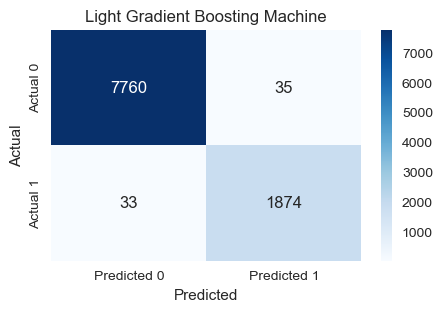

Accuracy: 0.99
Precision: 0.98
Recall: 0.98
F1-Score: 0.98


In [53]:
# Calculate confusion matrix
lgbm_conf_matrix = confusion_matrix(y_test, lightgbm_y_pred)

# Calculate other classification metrics
lgbm_accuracy = accuracy_score(y_test, lightgbm_y_pred)
lgbm_precision = precision_score(y_test, lightgbm_y_pred)
lgbm_recall = recall_score(y_test, lightgbm_y_pred)
lgbm_f1 = f1_score(y_test, lightgbm_y_pred)

# Display confusion matrix as heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(lgbm_conf_matrix,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Light Gradient Boosting Machine')
plt.show()

# Display other classification metrics
print(f"Accuracy: {lgbm_accuracy:.2f}")
print(f"Precision: {lgbm_precision:.2f}")
print(f"Recall: {lgbm_recall:.2f}")
print(f"F1-Score: {lgbm_f1:.2f}")

### Extra Trees Classifier

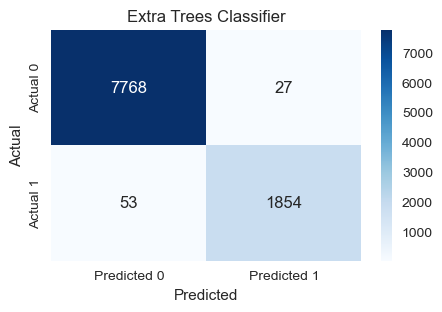

Accuracy: 0.99
Precision: 0.99
Recall: 0.97
F1-Score: 0.98


In [54]:
# Calculate confusion matrix
et_conf_matrix = confusion_matrix(y_test, et_y_pred)

# Calculate other classification metrics
et_accuracy = accuracy_score(y_test, et_y_pred)
et_precision = precision_score(y_test, et_y_pred)
et_recall = recall_score(y_test, et_y_pred)
et_f1 = f1_score(y_test, et_y_pred)

# Display confusion matrix as heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(et_conf_matrix,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Extra Trees Classifier')
plt.show()

# Display other classification metrics
print(f"Accuracy: {et_accuracy:.2f}")
print(f"Precision: {et_precision:.2f}")
print(f"Recall: {et_recall:.2f}")
print(f"F1-Score: {et_f1:.2f}")

### Random Forest Classifier

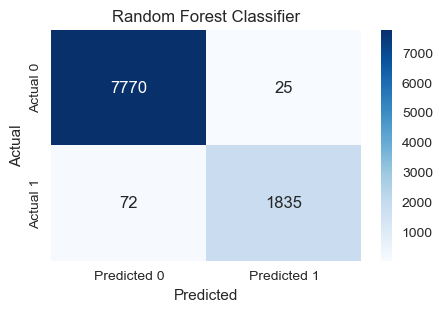

Accuracy: 0.99
Precision: 0.99
Recall: 0.96
F1-Score: 0.97


In [55]:
# Calculate confusion matrix
rf_conf_matrix = confusion_matrix(y_test, rf_y_pred)

# Calculate other classification metrics
rf_accuracy = accuracy_score(y_test, rf_y_pred)
rf_precision = precision_score(y_test, rf_y_pred)
rf_recall = recall_score(y_test, rf_y_pred)
rf_f1 = f1_score(y_test, rf_y_pred)

# Display confusion matrix as heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(rf_conf_matrix,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['Actual 0', 'Actual 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Random Forest Classifier')
plt.show()

# Display other classification metrics
print(f"Accuracy: {rf_accuracy:.2f}")
print(f"Precision: {rf_precision:.2f}")
print(f"Recall: {rf_recall:.2f}")
print(f"F1-Score: {rf_f1:.2f}")

# Use models to predict on unseen test data 

In [57]:
# Evaluation on test data 
X_eval=df_test_cleaned.drop('on_lift', axis=1)  
y_eval=df_test_cleaned['on_lift']

# Store true labels from test data
true_labels = y_eval

### Light Gradient Boosting Machine Classification on Unseen Test Data

In [67]:
# predict using Light Gradient Boosting Machine (LGBM) model on test data
lgbm_y_predictions_on_unseen = lightgbm_model.predict(X_eval)

# Evaluate accuracy by comparing predicted labels to true labels
lgbm_accuracy_on_unseen_data = accuracy_score(true_labels, lgbm_y_predictions_on_unseen)
print("Accuracy:", lgbm_accuracy_on_unseen_data)

print(' ') #line break

# Get classification report for precision, recall, F1-score
print("Classification Report Light Gradient Boosting Machine\n")
print(classification_report(true_labels, lgbm_y_predictions_on_unseen))

Accuracy: 0.6342719494974666
 
Classification Report Light Gradient Boosting Machine

              precision    recall  f1-score   support

           0       0.76      0.80      0.78     19154
           1       0.01      0.00      0.01      4924

    accuracy                           0.63     24078
   macro avg       0.38      0.40      0.39     24078
weighted avg       0.60      0.63      0.62     24078



### Extra Trees Classification on Unseen Test Data

In [68]:
# predict using Light Gradient Boosting Machine (LGBM) model on test data
et_y_predictions_on_unseen = et_model.predict(X_eval)

# Evaluate accuracy by comparing predicted labels to true labels
et_accuracy_on_unseen_data = accuracy_score(true_labels, et_y_predictions_on_unseen)
print("Accuracy:", et_accuracy_on_unseen_data)

print(' ') #line break

# Get classification report for precision, recall, F1-score
print("Classification Report Extra Trees Classifier\n")
print(classification_report(true_labels, et_y_predictions_on_unseen))

Accuracy: 0.9216297034637428
 
Classification Report Extra Trees Classifier

              precision    recall  f1-score   support

           0       0.91      1.00      0.95     19154
           1       0.97      0.64      0.77      4924

    accuracy                           0.92     24078
   macro avg       0.94      0.82      0.86     24078
weighted avg       0.93      0.92      0.92     24078



### Random Forest Classification on Unseen Test Data

In [69]:
# predict using Light Gradient Boosting Machine (LGBM) model on test data
rf_y_predictions_on_unseen = rf_model.predict(X_eval)

# Evaluate accuracy by comparing predicted labels to true labels
rf_accuracy_on_unseen_data = accuracy_score(true_labels, rf_y_predictions_on_unseen)
print("Accuracy:", rf_accuracy_on_unseen_data)

print(' ') #line break

# Get classification report for precision, recall, F1-score
print("Classification Report Random Forest Classifier\n")
print(classification_report(true_labels, rf_y_predictions_on_unseen))

Accuracy: 0.9622476949912784
 
Classification Report Random Forest Classifier

              precision    recall  f1-score   support

           0       0.96      0.99      0.98     19154
           1       0.96      0.85      0.90      4924

    accuracy                           0.96     24078
   macro avg       0.96      0.92      0.94     24078
weighted avg       0.96      0.96      0.96     24078



# Plotting Classification Results 

In [70]:
# add classification results to df 
df_test_concatenated['lgbm_prediction']=lgbm_y_predictions_on_unseen
df_test_concatenated['et_prediction']=et_y_predictions_on_unseen
df_test_concatenated['rf_prediction']=rf_y_predictions_on_unseen

#validate
df_test_concatenated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24078 entries, 0 to 24293
Data columns (total 51 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Timestamp                 24078 non-null  datetime64[ns]
 1   accelX(g)                 24078 non-null  float64       
 2   accelY(g)                 24078 non-null  float64       
 3   accelZ(g)                 24078 non-null  float64       
 4   accelUserX(g)             24078 non-null  float64       
 5   accelUserY(g)             24078 non-null  float64       
 6   accelUserZ(g)             24078 non-null  float64       
 7   gyroX(rad/s)              24078 non-null  float64       
 8   gyroY(rad/s)              24078 non-null  float64       
 9   gyroZ(rad/s)              24078 non-null  float64       
 10  Roll(rads)                24078 non-null  float64       
 11  Pitch(rads)               24078 non-null  float64       
 12  Yaw(rads)         

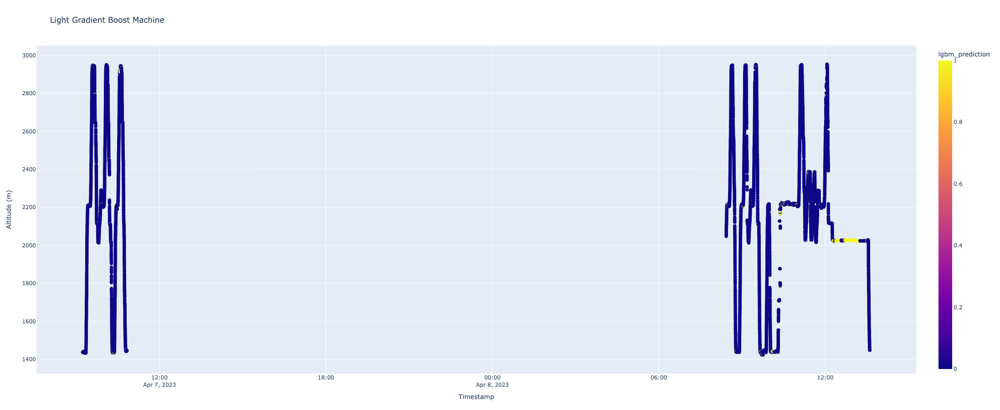

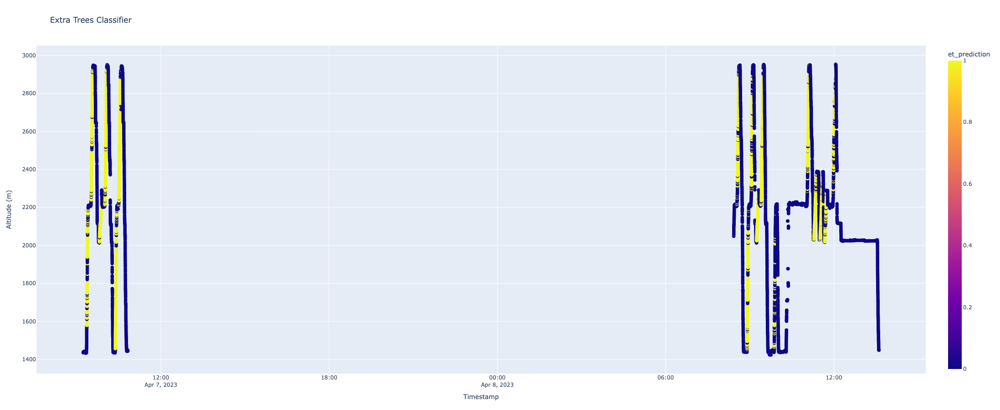

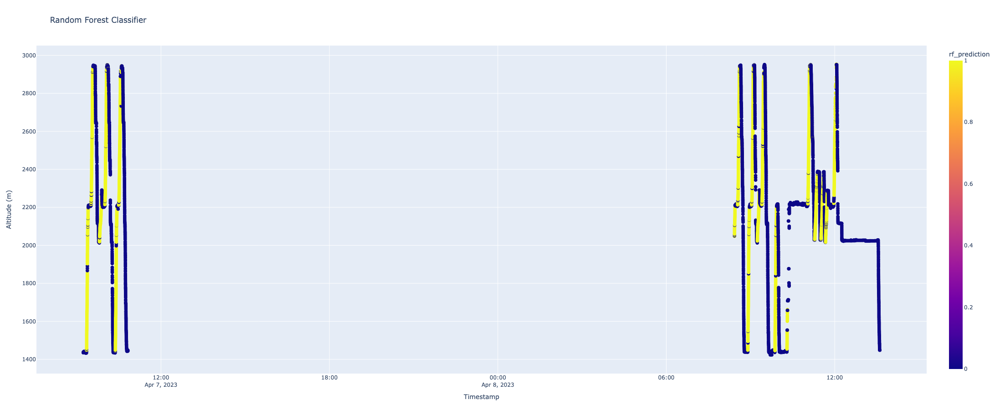

In [75]:
# plot predictions 

check_predictions(df=df_test_concatenated, 
                  predicted_column='lgbm_prediction', 
                  plot_title='Light Gradient Boost Machine')

check_predictions(df=df_test_concatenated, 
                  predicted_column='et_prediction', 
                  plot_title='Extra Trees Classifier')

check_predictions(df=df_test_concatenated, 
                  predicted_column='rf_prediction', 
                  plot_title='Random Forest Classifier')

# Random Forest Classifier Tuning 

In [81]:
print(py_best_model[2])

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)


In [80]:
# show rfc 
print(py_best_model[2])

# Tune RFC to find the best hyperparameters
rf_tuned = tune_model(py_best_model[2], 
                      fold=5, 
                      optimize='F1', 
                      n_iter=10)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9860,0.9986,0.9454,0.9822,0.9634,0.9547,0.9550
1,0.9866,0.9985,0.9480,0.9829,0.9652,0.9569,0.9571
2,0.9838,0.9979,0.9355,0.9807,0.9575,0.9475,0.9479
3,0.9836,0.9977,0.9302,0.9854,0.9570,0.9469,0.9475
4,0.9825,0.9982,0.9269,0.9826,0.9539,0.9431,0.9437
Mean,0.9845,0.9982,0.9372,0.9827,0.9594,0.9498,0.9503
Std,0.0015,0.0003,0.0083,0.0015,0.0042,0.0052,0.0050


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
